# Housing within planetary boundaries

In [1]:
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import folium 
from sqlalchemy import create_engine
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import fiona
import branca 
import mapclassify

# silence set copy warning
pd.options.mode.chained_assignment = None

In [2]:
# Database connection details
db_name = "urbanmining"
username = "postgres"
password = "Tunacompany5694!"
host = "localhost"  # or your host if it's not local
port = "5432"  # default port for PostgreSQL

# Create the connection string
connection_string = f"postgresql://{username}:{password}@{host}:{port}/{db_name}"
engine = create_engine(connection_string)

In [3]:
# plot geopandas
def plot_geopandas(gdf, column_name, title, color):
    import matplotlib.colors as mcolors
    import matplotlib as mpl    
    cmap = mcolors.LinearSegmentedColormap.from_list("mycmap", ["#ebebeb", color])

    fig, ax = plt.subplots(1, 1, figsize=(20, 10))
    gdf.plot(column=column_name, legend=True, ax=ax, cmap=cmap, 
             missing_kwds={'color': 'white', 'edgecolor': 'lightgrey', 'hatch': '///'})
    ax.axis('off')
    ax.set_title(title, fontsize=15)
    plt.show()

def plot_geopandas_twocolors(gdf, column_name, title):
    # normalize data to the range [-1, 1]
    import matplotlib.colors as mcolors
    import matplotlib as mpl    
    cmap = mcolors.LinearSegmentedColormap.from_list("mycmap", ["red", "#ebebeb", "green"])
    norm = mpl.colors.TwoSlopeNorm(vmin=gdf[column_name].min(), vcenter=0, vmax=gdf[column_name].max())

    fig, ax = plt.subplots(1, 1, figsize=(20, 10))
    gdf.plot(column=column_name, legend=True, ax=ax, cmap=cmap, norm=norm)
    ax.axis('off')
    ax.set_title(title, fontsize=15)
    plt.show()

# visualize the data on a folium map
def folium_choropleth(column_name, gdf_plot): 
    # make classes 
    classifier = mapclassify.NaturalBreaks.make(k=5)  # Change k to the number of classes you want
    gdf_plot['class'] = gdf_plot[[column_name]].apply(classifier)

    # Create a colormap scaled to the range of the classes
    min_class = gdf_plot['class'].min()
    max_class = gdf_plot['class'].max()
    colors = ["#f1eef6", "#bdc9e1", "#74a9cf", "#2b8cbe", "#045a8d"]
    colormap = branca.colormap.LinearColormap(colors, vmin=min_class, vmax=max_class).scale(min_class, max_class)
    colormap = branca.colormap.linear.OrRd_09.scale(min_class, max_class)

    def style_function(feature):
        color = colormap(feature['properties']['class'])
        return {
            'fillOpacity': 0.8,
            'weight': 0.5,
            'fillColor': color,
            'color': '#e3e3e3',
        }

    # visualize 
    m = folium.Map(location=[52.461113, 5.139320], tiles="Cartodb Positron", zoom_start=10.1)
    folium.GeoJson(
        gdf_plot,
        style_function=style_function
    ).add_to(m)

    # Add the colormap to the map
    colormap.caption = column_name
    m.add_child(colormap)
    
    return m 

# Carbon budget for housing in Amsterdam (in 2011)
The Netherlands: 
- embodied carbon: 41 Mt 
- operational carbon: 24 Mt
- total: 65 Mt 

Per capita: 
- embodied emissions: 2.46 t 
- operational emissions: 4.28 t 

For detailed calculations and sources, see [google sheet](https://docs.google.com/spreadsheets/d/1uhi4zqJfgFPEEBuRayYCYHoXFYByhTyg8pUabj1CGDQ/edit?usp=sharing)

In [4]:
# what % of built area in NL is housing? 

# write SQL query 
query = '''
WITH temp AS (
	SELECT * FROM bag_all_ams
	WHERE status = 'Verblijfsobject in gebruik' AND registration_end IS NULL
)

SELECT function, COUNT(*), SUM(sqm)
FROM temp
GROUP BY function
'''

# get % sqm for housing 
df = pd.read_csv('data/carbon_budgeting/builtAreaAms_byFunction.csv')
total_built_area = df['sum'].sum()
df['perc_sqm'] = df['sum'].map(lambda x: round(x/total_built_area*100))
perc_sqm_housing = df[df.function == 'woonfunctie'].perc_sqm.iloc[0]

# display 
print(f'Housing in Amsterdam takes up {perc_sqm_housing}% of its total built area.')

Housing in Amsterdam takes up 57% of its total built area.


In [5]:
df = pd.read_csv('data/carbon_budgeting/globalEmissionsBySector_ourWorldInData.csv')
df = df[(df.Entity == 'Netherlands') & (df.Year == 2011)].T
df.drop(['Entity', 'Code', 'Year'], axis=0, inplace=True)
df = df.reset_index()
df.rename(columns={4020: 'tCO2eq', 'index': 'emissions_type'}, inplace=True)
total_emissions_2011 = df.tCO2eq.sum()
df['percentage'] = df.tCO2eq.map(lambda x: round(x / total_emissions_2011 * 100))
df.emissions_type = df.emissions_type.map(lambda x: x.replace('Greenhouse gas emissions from ', ''))

fig = px.pie(df, names='emissions_type', values='tCO2eq', title='Netherlands CO2 emissions in 2011 by sector')
fig.show()

# Carbon budget per buurt in MRA 
Carbon budget for housing per capita: 
- embodied emissions: 2.46 t 
- operational emissions: 1.47 t 

For detailed calculations and sources, see [google sheet](https://docs.google.com/spreadsheets/d/1uhi4zqJfgFPEEBuRayYCYHoXFYByhTyg8pUabj1CGDQ/edit?usp=sharing)

In [6]:
# read data - gemeenten and buurten 
gemeenten_file_2012 = gpd.read_file('data/cbs/WijkBuurtkaart_2012_v3.gpkg', layer='gemeenten2012')
cbs_file_2012 = gpd.read_file('data/cbs/WijkBuurtkaart_2012_v3.gpkg', layer='cbs_buurten_2012')

In [7]:
# get MRA buurten 
minx, miny, maxx, maxy = 464251, 94102, 522817, 169853
cbs = cbs_file_2012.cx[miny:maxy, minx:maxx]
cbs = cbs[cbs.water == 'NEE']

# get columns related to operational carbon emissions - nhousing, gas usage, electricity usage
cbs = cbs[['buurtcode', 'aantal_inwoners', 'woningvoorraad', 'gemiddeld_gasverbruik_totaal', 
           'aandeel_stadsverwarming', 'gemiddeld_elektriciteitsverbruik_totaal', 
           'geometry']]

# change -9999 values to NaN
columns_list = cbs.columns.tolist()
columns_list.remove('geometry')
columns_list.remove('buurtcode')
for column_name in columns_list:
    cbs.loc[cbs[column_name] < 0, column_name] = np.nan

cbs['emissionsBudget_embodied_kg'] = cbs.aantal_inwoners * 2.46 * 1016
cbs['emissionsBudget_operational_kg'] = cbs.aantal_inwoners * 4.28 * 1016
cbs['emissionsBudget_total_kg'] = cbs.emissionsBudget_embodied_kg + cbs.emissionsBudget_operational_kg

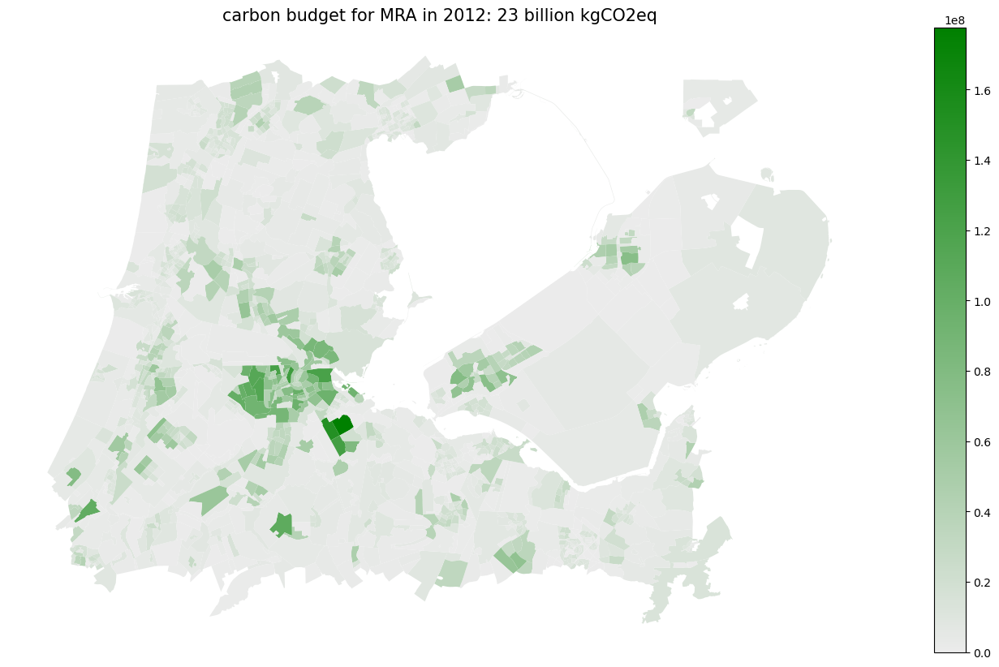

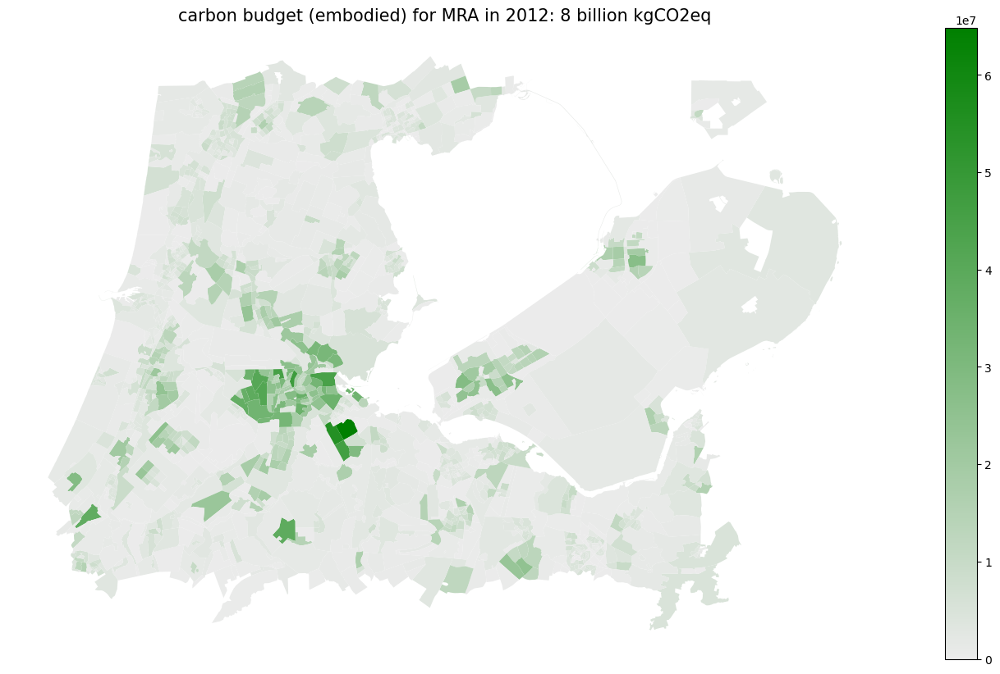

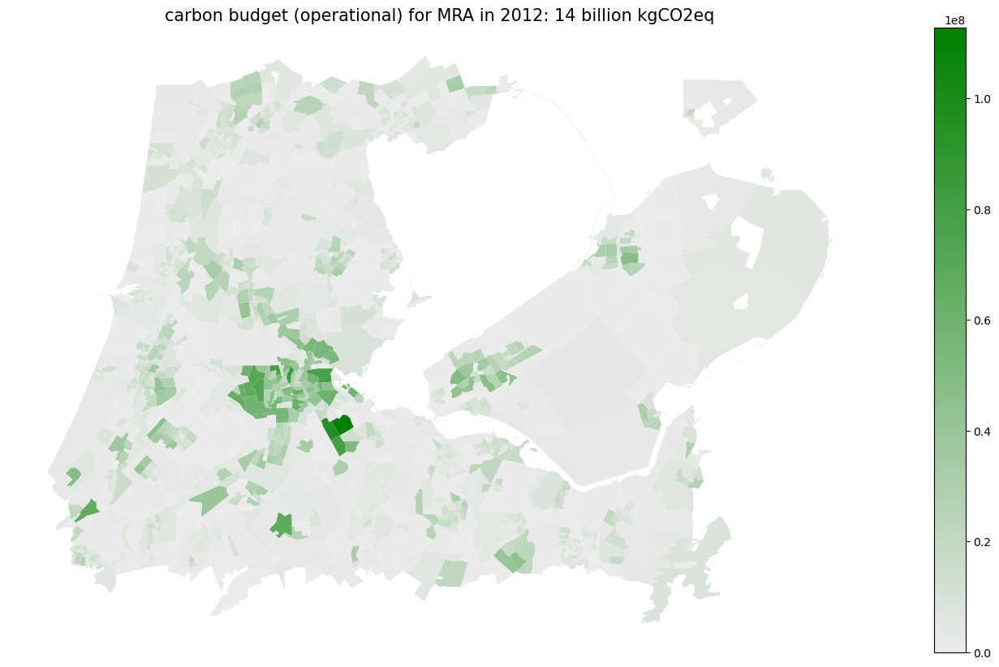

In [8]:
title_text = f'carbon budget for MRA in 2012: {round(cbs.emissionsBudget_total_kg.sum()/1000000000)} billion kgCO2eq'
plot_geopandas(cbs, 'emissionsBudget_total_kg', title_text, 'green')
title_text = f'carbon budget (embodied) for MRA in 2012: {round(cbs.emissionsBudget_embodied_kg.sum()/1000000000)} billion kgCO2eq'
plot_geopandas(cbs, 'emissionsBudget_embodied_kg', title_text, 'green')
title_text = f'carbon budget (operational) for MRA in 2012: {round(cbs.emissionsBudget_operational_kg.sum()/1000000000)} billion kgCO2eq'
plot_geopandas(cbs, 'emissionsBudget_operational_kg', title_text, 'green')

# Embodied vs operational carbon intensities
Embodied carbon per m2 (numbers below correspond to emissions per life cycle stage)
- new construction: 316 kgCO2eq/m2
- renovation: 126 kgCO2eq/m2
- demolition: 77 kgCO2eq/m2

Operational carbon (electricity and gas): 
- Electricity: 0.45 kgCO2eq/kWh
- Natural gas: 4.54 kgCO2eq/m3

see [google sheet](https://docs.google.com/spreadsheets/d/1uhi4zqJfgFPEEBuRayYCYHoXFYByhTyg8pUabj1CGDQ/edit#gid=1226912505) for more info

## Operational carbon 
What is the operation carbon for each buurt in 2012? 
- Electricity: 0.45 kgCO2eq/kWh
- Natural gas: 
    - 4.54 kgCO2eq/m3
    - 0.43 kgCO2eq/kWh
- Energy (in general): 0.15 kgCO2eq/kWh 

In [64]:
# calculate annual operational carbon emissions for each buurt
cbs['av_gasUsage_kWh'] = cbs.gemiddeld_gasverbruik_totaal * 10.55
cbs['emissions_operational_gas_kg'] = cbs.woningvoorraad * cbs.gemiddeld_gasverbruik_totaal * 1.9
cbs['emissions_operational_electricity_kg'] = cbs.woningvoorraad * cbs.gemiddeld_elektriciteitsverbruik_totaal * 0.15
cbs['emissions_operational_total_kg'] = cbs.emissions_operational_gas_kg + cbs.emissions_operational_electricity_kg
cbs['emissions_operational_perCapita_kg'] = cbs.emissions_operational_total_kg / cbs.aantal_inwoners

In [69]:
n_houses = cbs.woningvoorraad.sum()
kg_operational_emissions = cbs.emissions_operational_total_kg.sum()
kg_operational_emissions_perHouse = kg_operational_emissions / n_houses
kg_operational_emissions_perHouse / 80

38.145690604694494

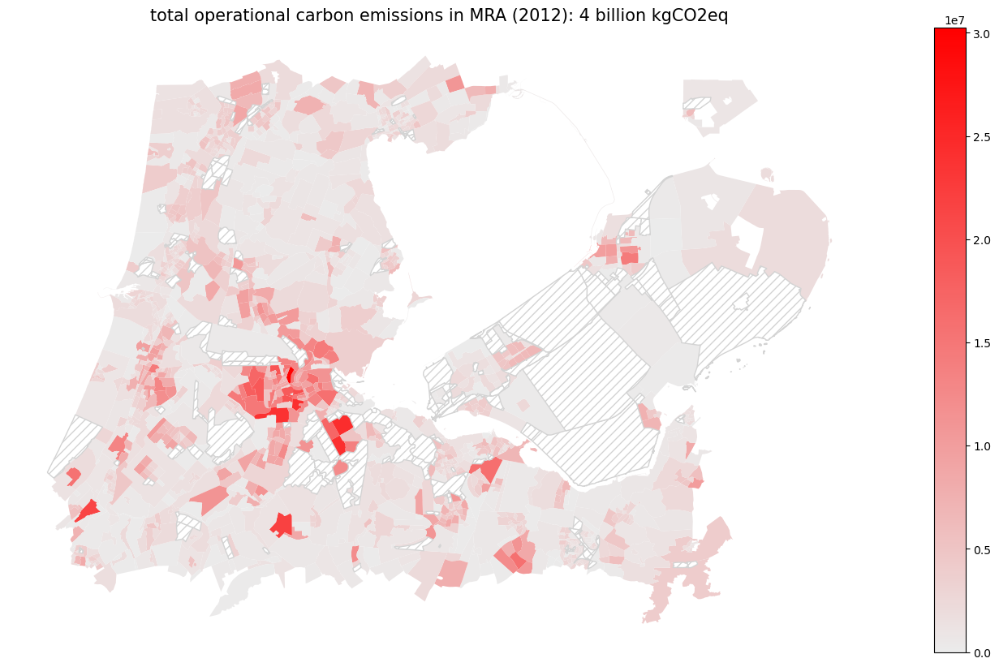

In [66]:
title_text = f'total operational carbon emissions in MRA (2012): {round(cbs.emissions_operational_total_kg.sum()/1000000000)} billion kgCO2eq'
plot_geopandas(cbs, 'emissions_operational_total_kg', title_text, 'red')

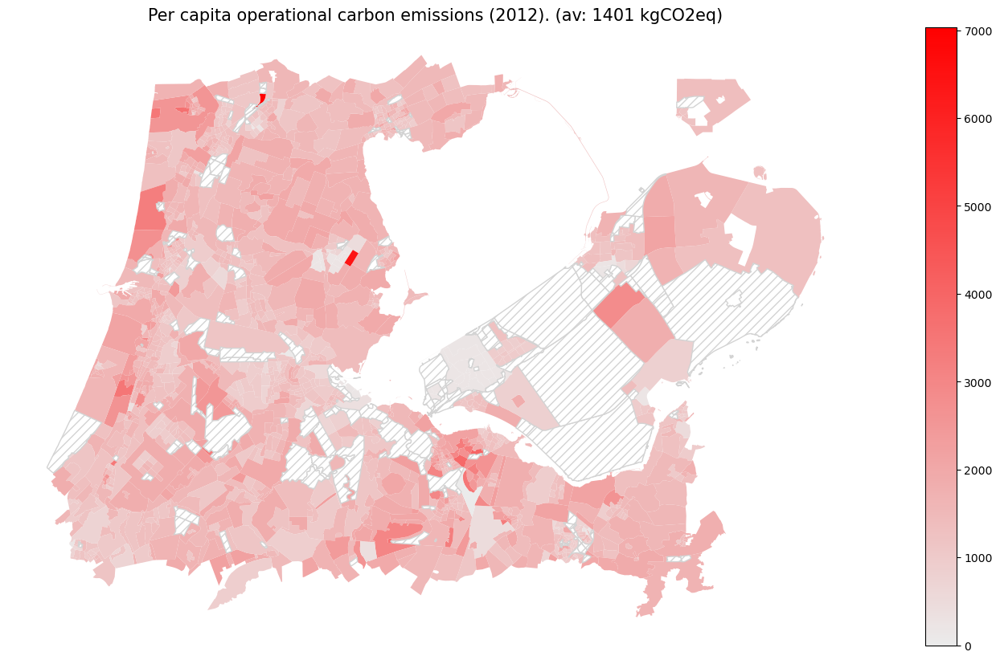

In [11]:
title_text = f'Per capita operational carbon emissions (2012). (av: {round(cbs.emissions_operational_perCapita_kg.mean())} kgCO2eq)'
plot_geopandas(cbs, 'emissions_operational_perCapita_kg', title_text, 'red')

In [12]:
# plotly scatter plot of cbs
fig = px.scatter(cbs, x='emissions_operational_total_kg', y='emissions_operational_perCapita_kg', 
                 title='Operational carbon emissions in MRA (2012)')
fig.show()

In [13]:
gas_total = cbs.emissions_operational_gas_kg.sum()
elec_total = cbs.emissions_operational_electricity_kg.sum()

# plotly pie chart for gas and elec_total
fig = go.Figure(data=[go.Pie(labels=['Gas', 'Electricity'], values=[gas_total, elec_total])])
fig.update_layout(title='Kg operational carbon emissions in MRA (2012)', width=500)
fig.show()

## Embodied carbon
Embodied carbon per m2 (numbers below correspond to emissions per life cycle stage)
- new construction: 316 kgCO2eq/m2
- renovation: 126 kgCO2eq/m2
- demolition: 77 kgCO2eq/m2

see [google sheet](https://docs.google.com/spreadsheets/d/1uhi4zqJfgFPEEBuRayYCYHoXFYByhTyg8pUabj1CGDQ/edit#gid=1226912505) for more info

In [14]:
query = '''
-- get ids and coordinates for all constructed housing in 2011
WITH building_coordinates AS (
    SELECT DISTINCT ON (id_pand) id_pand, x_28992, y_28992
    FROM bag_all_mra
    WHERE 
        -- get housing units in right date range
        p_document_date > '2011-01-01' AND p_document_date < '2012-01-01' AND 
        function = 'woonfunctie' AND sqm < 9999
), 

-- get all constructed housing (as buildings) in 2012 and corresponding sqm 
constructed_units AS (
    SELECT DISTINCT ON (id_vbo) id_vbo, id_pand, sqm, status, p_status
    FROM bag_all_mra
    WHERE 
        -- get constructed, renovated, and demolished units 
        (
            (status = 'Verblijfsobject gevormd' AND p_status = 'Bouw gestart') OR 
            (status = 'Verbouwing verblijfsobject' AND (p_status IN ('Verbouwing pand', 'Pand in gebruik', 'Pand in gebruik (niet ingemeten)'))) OR 
            (status = 'Verblijfsobject ingetrokken' AND p_status = 'Pand gesloopt')
        ) AND 
        -- get housing units in right date range
        p_document_date > '2011-01-01' AND p_document_date < '2012-01-01' AND 
        function = 'woonfunctie' AND sqm < 9999
), 
constructed_buildings AS (
    SELECT id_pand, status, SUM(sqm) AS sqm, COUNT(*) AS n_units
    FROM constructed_units
    GROUP BY id_pand, status
)

-- join constructed buildings with their corresponding coordinates using id_pand 
SELECT bc.id_pand, bc.x_28992, bc.y_28992, cb.status, cb.sqm AS sqm, cb.n_units
FROM building_coordinates bc
RIGHT JOIN constructed_buildings cb
ON bc.id_pand = cb.id_pand
'''
buildings_sql_output = pd.read_sql(query, engine)
print(f'largest constructed / renovated / demolished building in 2011: {buildings_sql_output.sqm.max()} sqm')

largest constructed / renovated / demolished building in 2011: 22271 sqm


Embodied carbon per m2 (numbers below correspond to emissions per life cycle stage)
- new construction: 316 kgCO2eq/m2
- renovation: 126 kgCO2eq/m2
- demolition: 77 kgCO2eq/m2

In [15]:
buildings = buildings_sql_output.copy()
def calc_emissions(row): 
    if row.status == 'Verblijfsobject gevormd':
        row['CO2_construction_kg'] = row.sqm * 316
    elif row.status == 'Verbouwing verblijfsobject':
        row['CO2_renovation_kg'] = row.sqm * 126
    elif row.status == 'Verblijfsobject ingetrokken':
        row['CO2_demolition_kg'] = row.sqm * 77 
    return row 
buildings = buildings.apply(lambda row: calc_emissions(row), axis=1)
# make geodataframe using columns x and y
buildings = gpd.GeoDataFrame(buildings, crs='EPSG:28992', 
                             geometry=gpd.points_from_xy(buildings.x_28992, buildings.y_28992))
buildings.drop(['x_28992', 'y_28992'], axis=1, inplace=True)
buildings.fillna(0, inplace=True)
buildings['emissions_embodied_kg'] = buildings.CO2_construction_kg + buildings.CO2_demolition_kg + buildings.CO2_renovation_kg

# folium map 
buildings_folium = buildings.to_crs('epsg:4326')
m = folium.Map(location=[52.461113, 5.139320], tiles="Cartodb Positron", zoom_start=10.1)
def addFoliumCircle(column_name, color): 
    for i in range(0, len(buildings_folium)):
        emissions = buildings_folium.iloc[i][column_name]
        radius = 0 if np.isnan(emissions) else emissions/1000
        folium.Circle(
            location=[buildings_folium.iloc[i]['geometry'].y, buildings_folium.iloc[i]['geometry'].x],
            radius=radius,
            color=color,
            fill=True,
            fill_color=color
        ).add_to(m)
addFoliumCircle('CO2_construction_kg' , 'red')
addFoliumCircle('CO2_demolition_kg' , 'green')
addFoliumCircle('CO2_renovation_kg' , 'blue')
m

# Carbon emissions during study period
Study period: jan 2011 - dec 2023 
- What was the total embodied carbon generated by construction and renovation of housing in Amsterdam during the study period? 
- What was the total operational carbon generated housing in Amsterdam during the study period? 

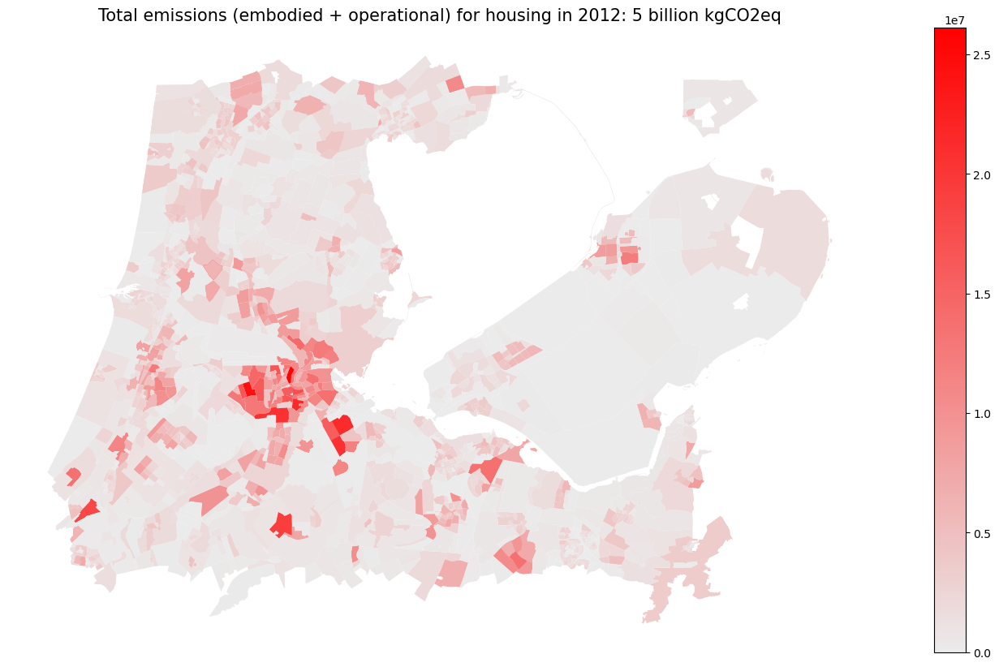

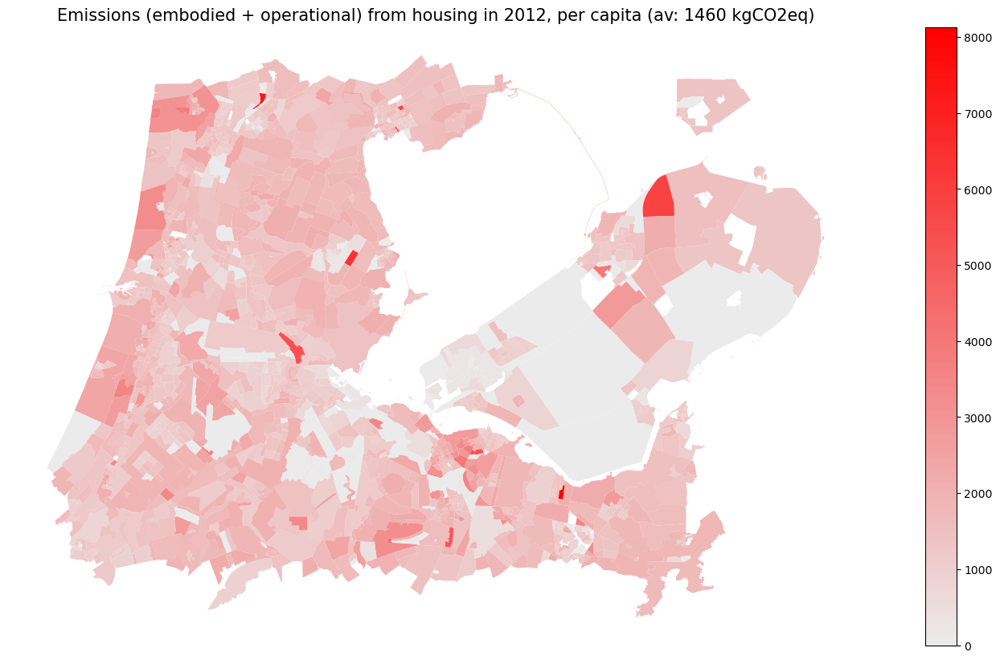

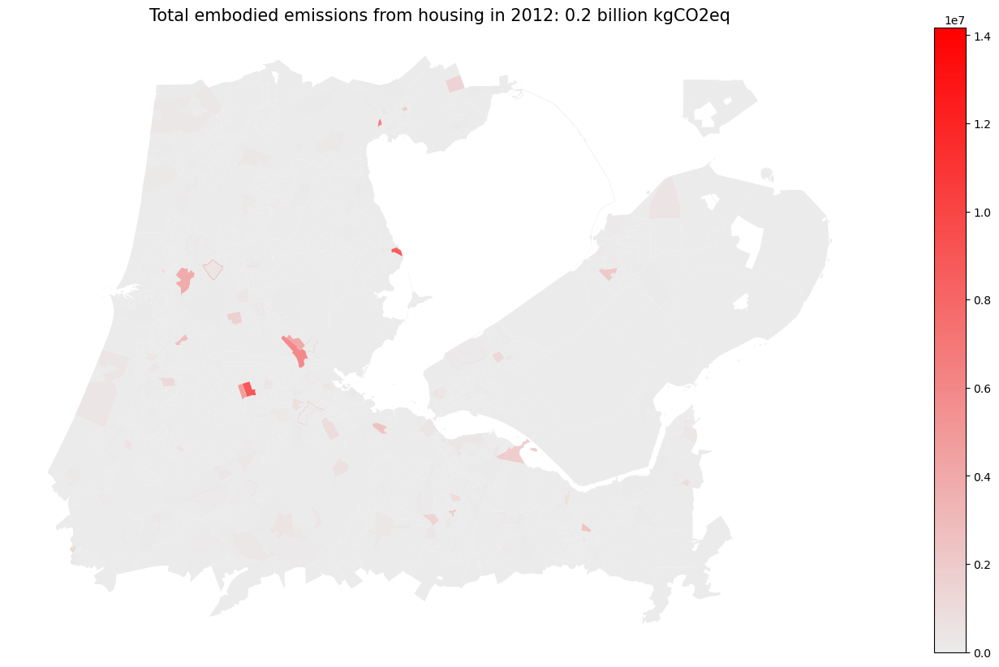

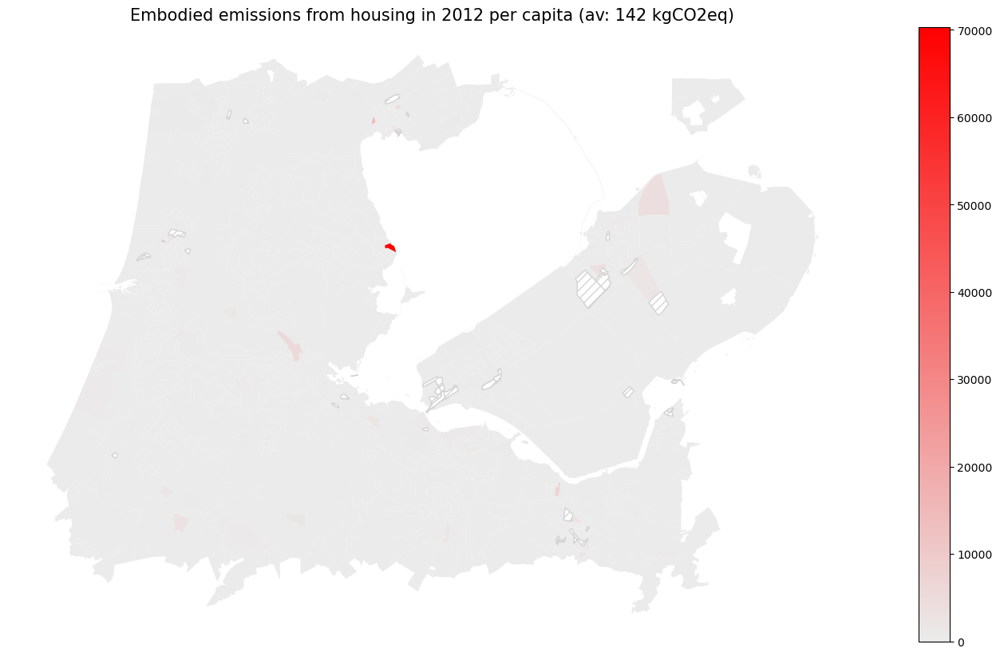

In [16]:
# aggregate construction sqm and emissions by buurtcode 
buildings_buurt = gpd.sjoin(cbs, buildings, predicate='contains')
buildings_buurt = buildings_buurt.groupby(['buurtcode', 'status']).agg({'emissions_embodied_kg': 'sum', 
                                                                        'sqm': 'sum', 'n_units': 'sum'}).reset_index()
cbs_emissions = pd.merge(cbs, buildings_buurt, on='buurtcode', how='left')
cbs_emissions.fillna(0, inplace=True)
cbs_emissions = cbs_emissions[['buurtcode', 'aantal_inwoners', 'woningvoorraad', 'geometry', 
                             'emissionsBudget_embodied_kg', 'emissionsBudget_operational_kg', 'emissionsBudget_total_kg', 
                             'emissions_operational_total_kg', 'emissions_operational_gas_kg', 'emissions_operational_electricity_kg',
                             'emissions_operational_perCapita_kg', 'status', 'emissions_embodied_kg', 'sqm', 'n_units']]
cbs_emissions['emissions_total_kg'] = cbs_emissions.emissions_operational_total_kg + cbs_emissions.emissions_embodied_kg
cbs_emissions['emissions_perCapita_kg'] = cbs_emissions.emissions_total_kg / cbs_emissions.aantal_inwoners
cbs_emissions['emissions_perCapita_kg'] = cbs_emissions['emissions_perCapita_kg'].replace([np.inf, -np.inf], 0)
cbs_emissions['emissions_embodied_perCapita_kg'] = cbs_emissions.emissions_embodied_kg / cbs_emissions.aantal_inwoners
cbs_emissions['emissions_embodied_perCapita_kg'] = cbs_emissions['emissions_embodied_perCapita_kg'].replace([np.inf, -np.inf], 0)

# display
plot_geopandas(cbs_emissions, 'emissions_total_kg', 
               f'Total emissions (embodied + operational) for housing in 2012: {round(cbs_emissions.emissions_total_kg.sum()/1000000000)} billion kgCO2eq',
               'red')
plot_geopandas(cbs_emissions[cbs_emissions.emissions_perCapita_kg < 15000], 'emissions_perCapita_kg', 
               f'Emissions (embodied + operational) from housing in 2012, per capita (av: {round(cbs_emissions.emissions_perCapita_kg.mean())} kgCO2eq)', 
               'red')
title = f'Total embodied emissions from housing in 2012: {round(cbs_emissions.emissions_embodied_kg.sum()/1000000000, 1)} billion kgCO2eq'
plot_geopandas(cbs_emissions, 'emissions_embodied_kg', title, 'red') 
title = f'Embodied emissions from housing in 2012 per capita (av: {round(cbs_emissions.emissions_embodied_perCapita_kg.mean())} kgCO2eq)'
plot_geopandas(cbs_emissions, 'emissions_embodied_perCapita_kg', title, 'red') 

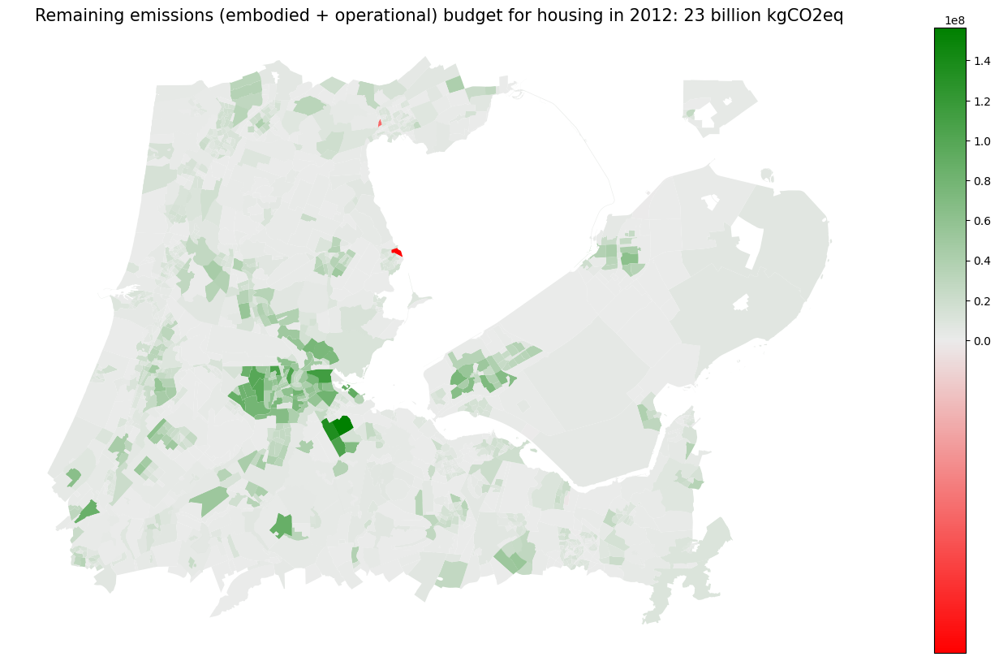

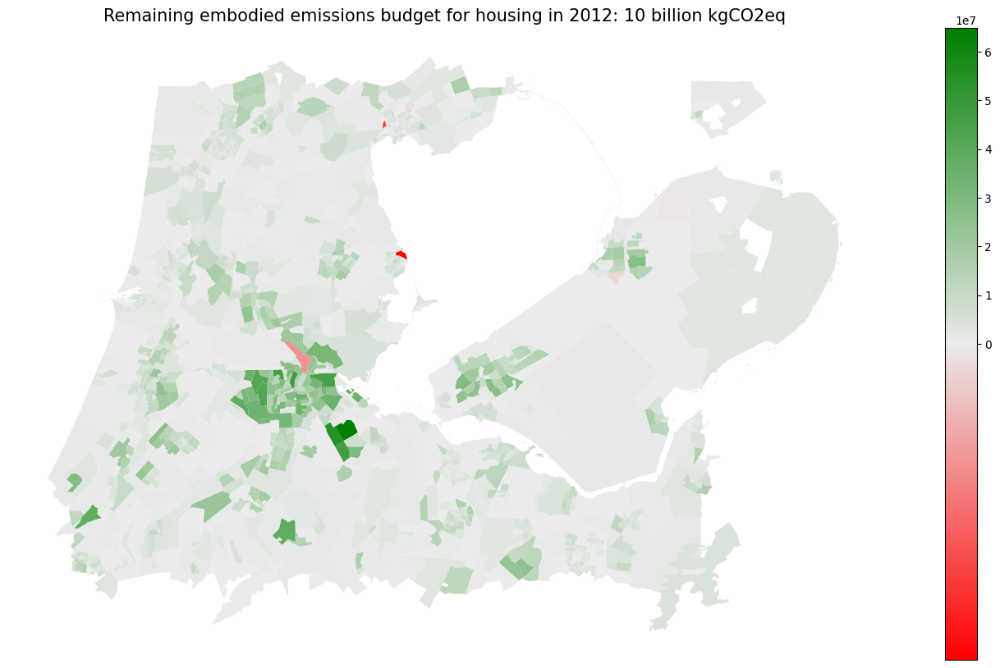

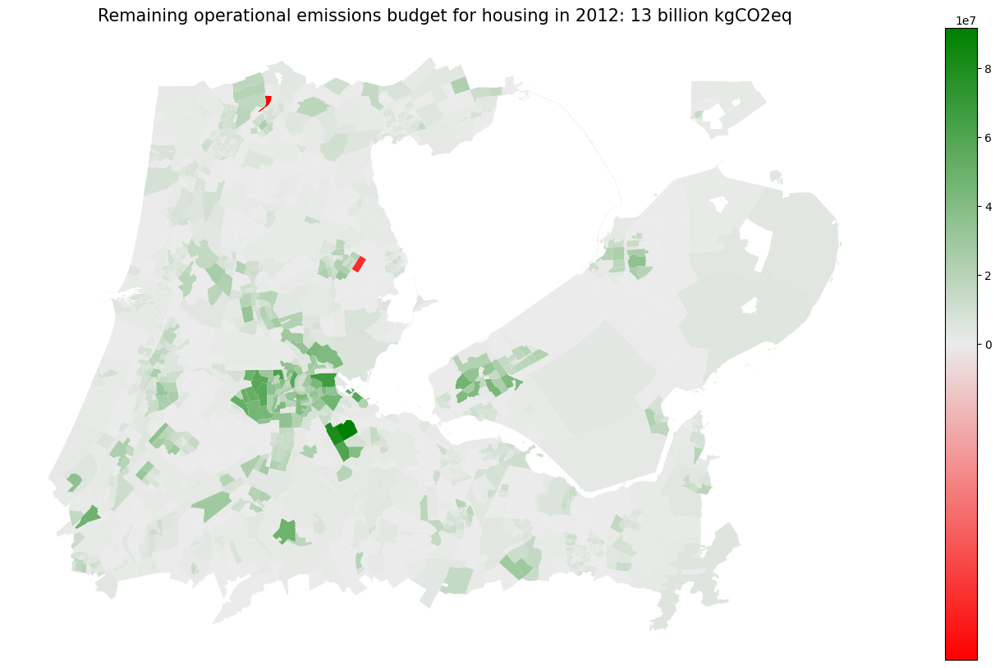

In [17]:
cbs_emissions['emissions_remaining_kg'] = cbs_emissions.emissionsBudget_total_kg - cbs_emissions.emissions_total_kg
cbs_emissions['emissions_remaining_embodied_kg'] = cbs_emissions.emissionsBudget_embodied_kg - cbs_emissions.emissions_embodied_kg
cbs_emissions['emissions_remaining_operational_kg'] = cbs_emissions.emissionsBudget_operational_kg - cbs_emissions.emissions_operational_total_kg

def plot_geopandas_twocolors(gdf, column_name, title):
    # normalize data to the range [-1, 1]
    import matplotlib.colors as mcolors
    import matplotlib as mpl    
    cmap = mcolors.LinearSegmentedColormap.from_list("mycmap", ["red", "#ebebeb", "green"])
    norm = mpl.colors.TwoSlopeNorm(vmin=cbs_emissions[column_name].min(), vcenter=0, vmax=cbs_emissions[column_name].max())

    fig, ax = plt.subplots(1, 1, figsize=(20, 10))
    gdf.plot(column=column_name, legend=True, ax=ax, cmap=cmap, norm=norm)
    ax.axis('off')
    ax.set_title(title, fontsize=15)
    plt.show()

plot_geopandas_twocolors(cbs_emissions, 'emissions_remaining_kg', 
                         f'Remaining emissions (embodied + operational) budget for housing in 2012: {round(cbs_emissions.emissions_remaining_kg.sum()/1000000000)} billion kgCO2eq')# # display
plot_geopandas_twocolors(cbs_emissions, 'emissions_remaining_embodied_kg',
                         f'Remaining embodied emissions budget for housing in 2012: {round(cbs_emissions.emissions_remaining_embodied_kg.sum()/1000000000)} billion kgCO2eq')
plot_geopandas_twocolors(cbs_emissions, 'emissions_remaining_operational_kg',
                         f'Remaining operational emissions budget for housing in 2012: {round(cbs_emissions.emissions_remaining_operational_kg.sum()/1000000000)} billion kgCO2eq')


# Calculating average embodied / operational CO2 emissions per sqm
- What is the av. embodied emissions per sqm for all buildings constructed / renovated / demolished in 2012? 
- What is the av. operational emissions per sqm for all buildings in 2012? 

In [27]:
# calculating embodied emissions 
df = cbs_emissions[['emissions_embodied_kg', 'sqm', 'n_units', 'buurtcode', 'geometry']]
df = df[df.sqm > 0]
av_embodied_emissions_perSqm = df.emissions_embodied_kg.sum() / df.sqm.sum()
print(f'average embodied emissions per sqm: {round(av_embodied_emissions_perSqm)} kgCO2eq / sqm')

average embodied emissions per sqm: 231 kgCO2eq / sqm


In [82]:
# sql query for all sqm of in use housing in 2012 
query = '''
-- get ids and coordinates for all constructed housing in 2011
WITH building_coordinates AS (
    SELECT DISTINCT ON (id_pand) id_pand, x_28992, y_28992
    FROM bag_all_mra
    WHERE 
        -- get housing units in right date range
        p_document_date > '2011-01-01' AND p_document_date < '2012-01-01' AND 
        function = 'woonfunctie' AND sqm < 9999
), 

-- get all in use housing (as buildings) in 2012 and corresponding sqm 
inuse_units AS (
    SELECT DISTINCT ON (id_vbo) id_vbo, id_pand, sqm, status, p_status
    FROM bag_all_mra
    WHERE 
        -- get in use units 
        status = 'Verblijfsobject in gebruik' AND 
        -- get housing units in right date range
        p_document_date > '2011-01-01' AND p_document_date < '2012-01-01' AND 
        function = 'woonfunctie' AND sqm < 9999
), 
constructed_buildings AS (
    SELECT id_pand, SUM(sqm) AS sqm, COUNT(*) AS n_units
    FROM inuse_units
    GROUP BY id_pand
)

-- join constructed buildings with their corresponding coordinates using id_pand 
SELECT bc.id_pand, bc.x_28992, bc.y_28992, cb.sqm AS sqm, cb.n_units
FROM building_coordinates bc
RIGHT JOIN constructed_buildings cb
ON bc.id_pand = cb.id_pand
'''
buildings_sql_output = pd.read_sql(query, engine)
print(f'largest in use building in 2011: {buildings_sql_output.sqm.max()} sqm')

largest in use building in 2011: 40738 sqm


In [83]:
# get total sqm of in use buildings and total operational emissions in 2012 
buildings = buildings_sql_output.copy()
total_sqm = buildings.sqm.sum()
total_operational_emissions = cbs_emissions.emissions_operational_total_kg.sum()
print(f'average operational emissions per sqm in 2012: {round(total_operational_emissions / total_sqm)} kgCO2eq / sqm')

average operational emissions per sqm in 2012: 456 kgCO2eq / sqm


In [84]:
n_houses = cbs.woningvoorraad.sum()
kg_operational_emissions = cbs.emissions_operational_total_kg.sum()
kg_operational_emissions_perHouse = kg_operational_emissions / n_houses
print(f'kgCO2eq per sqm in 2012 (assuming av house size of 65 sqm): {round(kg_operational_emissions_perHouse / 65)}')
print(f'total sqm housing according to CBS (assuming av house size of 65 sqm): {round(n_houses * 65)}')
print(f'total sqm housing according to BAG dataset: {total_sqm}')
print(f'BAG dataset contains {round(total_sqm/(n_houses * 65)*100)}% of sqm of housing according to CBS')

kgCO2eq per sqm in 2012 (assuming av house size of 65 sqm): 47
total sqm housing according to CBS (assuming av house size of 65 sqm): 95232800
total sqm housing according to BAG dataset: 10756693
BAG dataset contains 11% of sqm of housing according to CBS


# Neighborhood types, categorized by embodied and operational carbon
- Which neighborhoods fall into the 4 types? (hh, hl, lh, ll)
- What are the characteristics of each type of neighborhood? 

In [110]:
# classify buurt based on emissions
df = cbs_emissions[['emissions_embodied_kg', 'emissions_operational_total_kg', 'geometry']]
def classify_buurt(row): 
    # type 1: high embodied, high operational
    if row.emissions_embodied_kg >= df.emissions_embodied_kg.mean() and row.emissions_operational_total_kg >= df.emissions_operational_total_kg.mean():
        return '1 - high embodied, high operational'
    # type 2: high embodied, low operational
    elif row.emissions_embodied_kg >= df.emissions_embodied_kg.mean() and row.emissions_operational_total_kg < df.emissions_operational_total_kg.mean():
        return '2 - high embodied, low operational'
    # type 3: low embodied, high operational
    elif row.emissions_embodied_kg < df.emissions_embodied_kg.mean() and row.emissions_operational_total_kg >= df.emissions_operational_total_kg.mean():
        return '3 - low embodied, high operational'
    # type 4: low embodied, low operational
    else: 
        return '4 - low embodied, low operational'
df['buurt_type'] = df.apply(lambda row: classify_buurt(row), axis=1)

# plotly scatterplot of df
fig = px.scatter(df, x='emissions_operational_total_kg', y='emissions_embodied_kg', 
                 title='Embodied vs operational emissions in MRA (2012)', color='buurt_type')
fig.update_xaxes(type='log')
fig.update_yaxes(type='log')
fig.update_layout(width=800)
fig.show()

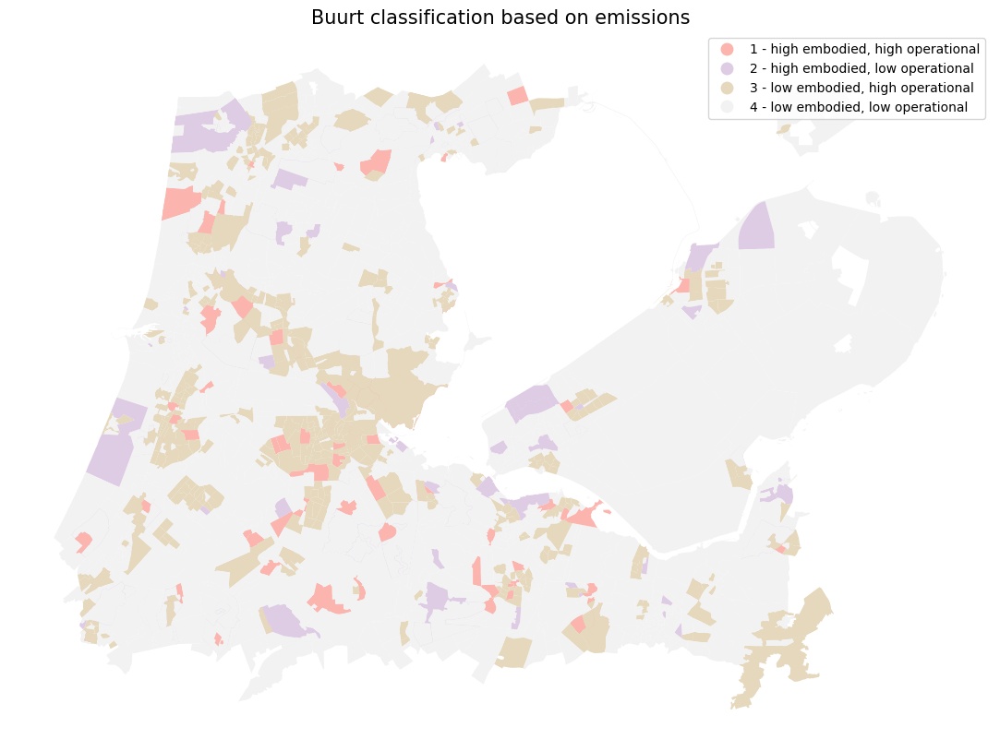

In [107]:
fig, ax = plt.subplots(1, 1, figsize=(20, 10))
df.plot(column='buurt_type', legend=True, ax=ax, cmap='Pastel1')
ax.axis('off')
ax.set_title('Buurt classification based on emissions', fontsize=15)
plt.show()

In [117]:
# plotly pie chart of buurt types
df_pie = df.groupby('buurt_type').size().reset_index(name='count')
fig = go.Figure(data=[go.Pie(labels=df_pie.buurt_type, values=df_pie['count'])])
fig.update_layout(title='Buurt classification based on emissions', width=600)
fig.show()